# Project 8 Homework - Working with OLS

In [1]:
import pandas as pd
import pandas_datareader as web
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
data = pd.read_csv("fraserDataWithRGDPPC.csv", index_col = [0,1], parse_dates = True)

## 1. Use the np.log() function to log the values of RGDP per capita. Create a lag for this new variable and rerun the regression using these new logged values as well as untransformed Economic Freedom Index Values (don't log these variables!). (hint: you may reimport the csv file).

In [10]:
data["Log RGDP Per Capita"] = np.log(data["RGDP Per Capita"])
data["Log RGDP Per Capita Lag"] = data.groupby("ISO_Code")["Log RGDP Per Capita"].shift()
data

EFW  Size of Government  \
ISO_Code Year                                       
ALB      2017-01-01  7.673511            7.528167   
         2016-01-01  7.637742            7.875862   
         2015-01-01  7.639666            7.904257   
         2014-01-01  7.586769            7.882037   
         2013-01-01  7.389525            7.807904   
...                       ...                 ...   
ZWE      2000-01-01  4.299839            5.365058   
         1995-01-01  5.518614            6.418859   
         1990-01-01  4.516140            5.108843   
         1985-01-01  4.226841            5.026250   
         1980-01-01  4.054740            6.322625   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
ALB      2017-01-01                        5.064907     9.648271   
         2016-01-01                        5.071814     9.553657   
         2015-01-01                        5.003489     9.585625   
         2014-01-01                        4.666740     9.629320   
         2013-01-01                        4.543782     9.690942   
...                                             ...          ...   
ZWE      2000-01-01                        4.662445     2.891166   
         1995-01-01                        5.138131     4.915293   
         1990-01-01                        3.439437     5.664840   
         1985-01-01                        2.633492     6.305850   
         1980-01-01                        1.379602     6.343342   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
ALB      2017-01-01                          8.343863    7.782349   
         2016-01-01                          8.214900    7.472476   
         2015-01-01                          8.109118    7.595838   
         2014-01-01                          8.208630    7.547119   
         2013-01-01                          7.705771    7.199224   
...                                               ...         ...   
ZWE      2000-01-01                          3.224735    5.355792   
         1995-01-01                          5.839664    5.423290   
         1990-01-01                          4.689623    3.953668   
         1985-01-01                          3.161743    4.207229   
         1980-01-01                          3.277015    3.280637   

                     RGDP Per Capita  Log RGDP Per Capita  \
ISO_Code Year                                               
ALB      2017-01-01              NaN                  NaN   
         2016-01-01          10342.0             9.243969   
         2015-01-01          10032.0             9.213535   
         2014-01-01           9808.0             9.190954   
         2013-01-01           9660.0             9.175749   
...                              ...                  ...   
ZWE      2000-01-01           2249.0             7.718241   
         1995-01-01           2156.0             7.676010   
         1990-01-01           2232.0             7.710653   
         1985-01-01           2198.0             7.695303   
         1980-01-01           2133.0             7.665285   

                     Log RGDP Per Capita Lag  
ISO_Code Year                                 
ALB      2017-01-01                      NaN  
         2016-01-01                      NaN  
         2015-01-01                 9.243969  
         2014-01-01                 9.213535  
         2013-01-01                 9.190954  
...                                      ...  
ZWE      2000-01-01                 7.708860  
         1995-01-01                 7.718241  
         1990-01-01                 7.676010  
         1985-01-01                 7.710653  
         1980-01-01                 7.695303  

[3030 rows x 9 columns]

In [3]:
y_var = ["Log RGDP Per Capita"]
x_vars = ["Size of Government",
          "Legal System & Property Rights", 
          "Sound Money", 
          "Freedom to trade internationally", 
          "Regulation"]
reg_vars = y_var + x_vars
reg_data = data[reg_vars].dropna()
reg_data.corr().round(4)

,Log RGDP Per Capita,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation
Log RGDP Per Capita,1.0000,-0.1612,0.7262,0.4857,0.5739,0.4976
Size of Government,-0.1612,1.0000,-0.1057,0.1982,0.2360,0.2044
Legal System & Property Rights,0.7262,-0.1057,1.0000,0.5231,0.6311,0.5983
Sound Money,0.4857,0.1982,0.5231,1.0000,0.6811,0.5996
Freedom to trade internationally,0.5739,0.2360,0.6311,0.6811,1.0000,0.6476
Regulation,0.4976,0.2044,0.5983,0.5996,0.6476,1.0000


In [4]:
reg_data.describe().round(4)

,Log RGDP Per Capita,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation
count,2731.0000,2731.0000,2731.0000,2731.0000,2731.0000,2731.0000
mean,9.1521,6.3548,5.2253,7.7906,6.9109,6.6714
std,1.2066,1.2302,1.7315,1.8347,1.5056,1.1629
min,6.2596,1.5731,0.9910,0.0000,0.0000,2.1015
25%,8.2924,5.5390,3.9577,6.7714,6.1841,5.9576
50%,9.3098,6.4203,5.1669,8.1503,7.1539,6.7737
75%,10.1021,7.1878,6.3335,9.3323,7.9795,7.4868
max,11.9595,9.5142,9.1381,9.9222,10.0000,9.4601


In [5]:
y = reg_data[y_var]
x = reg_data[x_vars]
#x["Constant"] = 1
results = sm.OLS(y,x).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                 
========================================================================================
Dep. Variable:     Log RGDP Per Capita   R-squared (uncentered):                   0.983
Model:                             OLS   Adj. R-squared (uncentered):              0.983
Method:                  Least Squares   F-statistic:                          3.159e+04
Date:                 Wed, 27 Oct 2021   Prob (F-statistic):                        0.00
Time:                         09:41:33   Log-Likelihood:                         -4378.7
No. Observations:                 2731   AIC:                                      8767.
Df Residuals:                     2726   BIC:                                      8797.
Df Model:                            5                                                  
Covariance Type:             nonrobust                                                  
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Size of Government                   0.2598      0.018     14.649      0.000       0.225       0.295
Legal System & Property Rights       0.3953      0.020     20.121      0.000       0.357       0.434
Sound Money                          0.0925      0.018      5.149      0.000       0.057       0.128
Freedom to trade internationally     0.1895      0.025      7.606      0.000       0.141       0.238
Regulation                           0.4912      0.027     18.514      0.000       0.439       0.543
==============================================================================
Omnibus:                      345.846   Durbin-Watson:                   0.296
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              617.511
Skew:                           0.828   Prob(JB):                    8.11e-135
Kurtosis:                       4.638   Cond. No.                         20.0
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## 2. Plot the residuals in a bar chart. Explain why the shape of the distribution of these residuals are distinct from the shape of the residuals plotted in the first regression from this lesson.

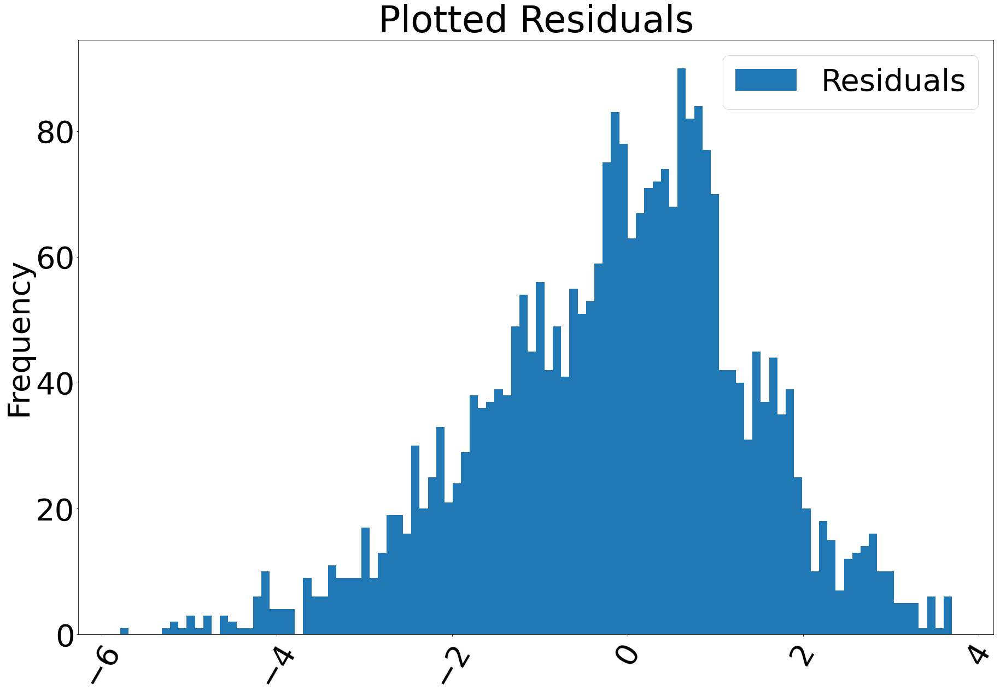

In [6]:
predictor = results.predict()
reg_data[y_var[0]+" Predictor"] = predictor

y_name = y_var[0]
y_hat = reg_data[y_name + " Predictor"]
y_mean = reg_data[y_name].mean()
y = reg_data[y_name]
reg_data["Residuals"] = (y_hat.sub(y_mean))
reg_data["Squared Residuals"] = reg_data["Residuals"].pow(2)
reg_data["Squared Errors"] = (y.sub(y_hat)).pow(2)
reg_data["Squared Totals"] = (y.sub(y_mean)).pow(2)

plt.rcParams.update({"font.size":56})
fig, ax = plt.subplots(figsize = (30,20))
reg_data[["Residuals"]].plot.hist(bins = 100, ax = ax)
plt.title("Plotted Residuals")
plt.xticks(rotation=60);

This plot of residuals is more accurate than the first outcome as the tails aren't quite as fat but there are still fat tails and alot of outliers. 

In [7]:
reg_data

Log RGDP Per Capita  Size of Government  \
ISO_Code Year                                                  
ALB      2016-01-01             9.243969            7.875862   
         2015-01-01             9.213535            7.904257   
         2014-01-01             9.190954            7.882037   
         2013-01-01             9.175749            7.807904   
         2012-01-01             9.168685            8.096375   
...                                  ...                 ...   
ZWE      2000-01-01             7.718241            5.365058   
         1995-01-01             7.676010            6.418859   
         1990-01-01             7.710653            5.108843   
         1985-01-01             7.695303            5.026250   
         1980-01-01             7.665285            6.322625   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
ALB      2016-01-01                        5.071814     9.553657   
         2015-01-01                        5.003489     9.585625   
         2014-01-01                        4.666740     9.629320   
         2013-01-01                        4.543782     9.690942   
         2012-01-01                        4.471492     9.710740   
...                                             ...          ...   
ZWE      2000-01-01                        4.662445     2.891166   
         1995-01-01                        5.138131     4.915293   
         1990-01-01                        3.439437     5.664840   
         1985-01-01                        2.633492     6.305850   
         1980-01-01                        1.379602     6.343342   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
ALB      2016-01-01                          8.214900    7.472476   
         2015-01-01                          8.109118    7.595838   
         2014-01-01                          8.208630    7.547119   
         2013-01-01                          7.705771    7.199224   
         2012-01-01                          7.115422    7.267629   
...                                               ...         ...   
ZWE      2000-01-01                          3.224735    5.355792   
         1995-01-01                          5.839664    5.423290   
         1990-01-01                          4.689623    3.953668   
         1985-01-01                          3.161743    4.207229   
         1980-01-01                          3.277015    3.280637   

                     Log RGDP Per Capita Predictor  Residuals  \
ISO_Code Year                                                   
ALB      2016-01-01                      10.162705   1.010628   
         2015-01-01                      10.186577   1.034500   
         2014-01-01                      10.046644   0.894567   
         2013-01-01                       9.718270   0.566193   
         2012-01-01                       9.688170   0.536093   
...                                            ...        ...   
ZWE      2000-01-01                       6.746612  -2.405465   
         1995-01-01                       7.924477  -1.227600   
         1990-01-01                       6.042045  -3.110032   
         1985-01-01                       5.596235  -3.555842   
         1980-01-01                       5.007433  -4.144644   

                     Squared Residuals  Squared Errors  Squared Totals  
ISO_Code Year                                                           
ALB      2016-01-01           1.021369        0.844077        0.008444  
         2015-01-01           1.070189        0.946810        0.003777  
         2014-01-01           0.800250        0.732206        0.001511  
         2013-01-01           0.320574        0.294329        0.000560  
         2012-01-01           0.287395        0.269865        0.000276  
...                                ...          

## 3. Plot a scatter plot with RGDP Per Capita on the horizontal axis and the predictor on the vertical axis. Then plot a scatter plot with RGDP Per Capita on the horizontal axis and the residual on the vertical axis. Are the residuals normally distributed? Why or why not? Why does this matter?

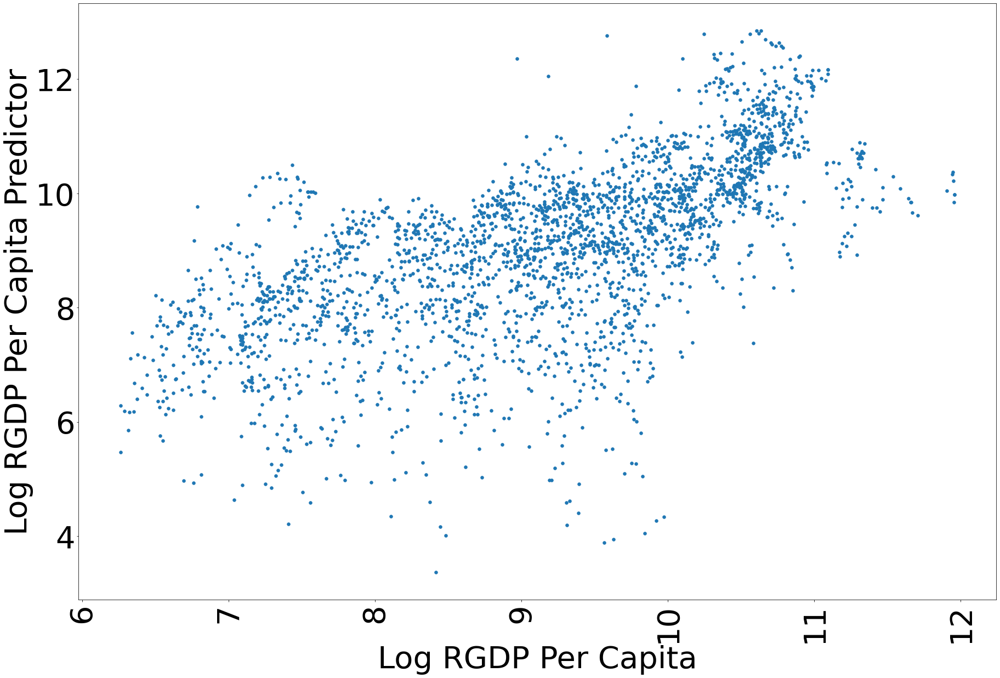

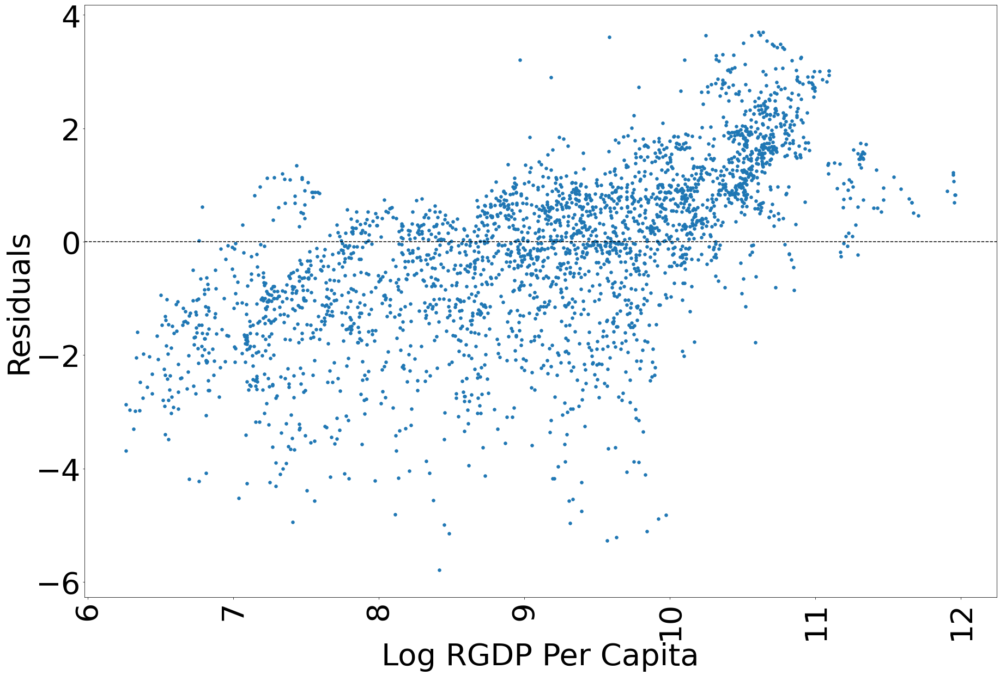

In [8]:
fig, ax = plt.subplots(figsize = (30,20))
reg_data.plot.scatter(x = y_var[0],
                 y = "Log RGDP Per Capita Predictor", 
                  s = 30, ax = ax)
plt.xticks(rotation=90)
plt.show()
plt.close()

fig, ax = plt.subplots(figsize = (30,20))
reg_data.plot.scatter(x = y_var[0],
                 y = "Residuals", 
                  s = 30, ax = ax)
ax.axhline(0, ls = "--", color = "k")
plt.xticks(rotation=90)
plt.show()
plt.close()

The residuals are not normally distributed and this is a problem because that impacts the accuracy of the predicted outcome as the error term will vary.

## 4. Plot the observed and predicted logged values of RGDP Per Capita for each individual country.

<ipython-input-9-47761a41df7e>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data[key] = plot_data[key] + 1


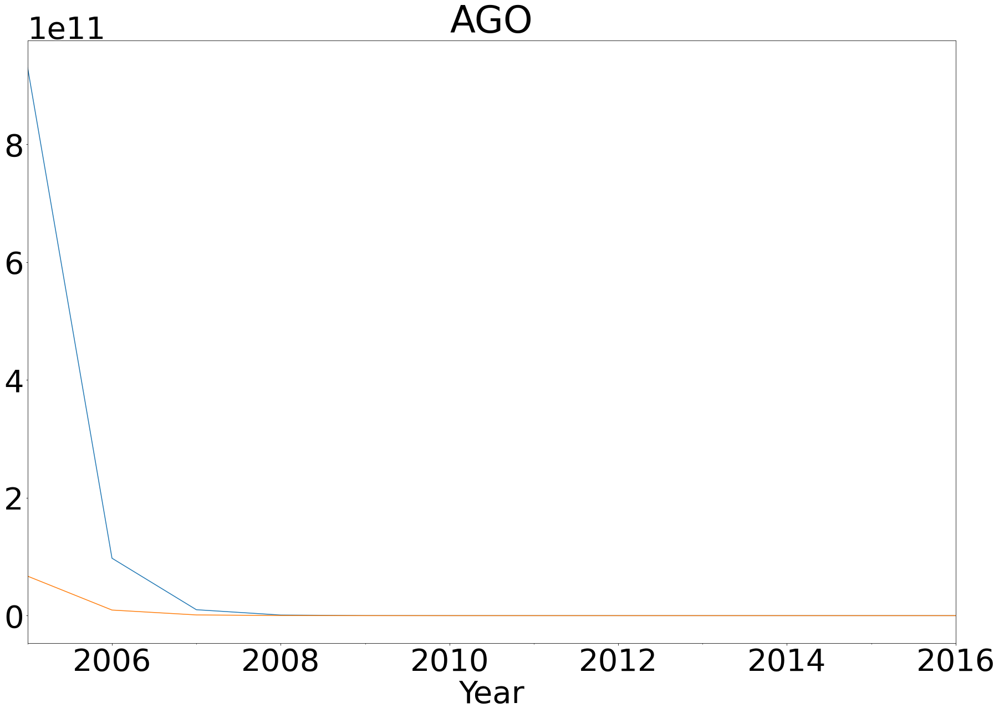

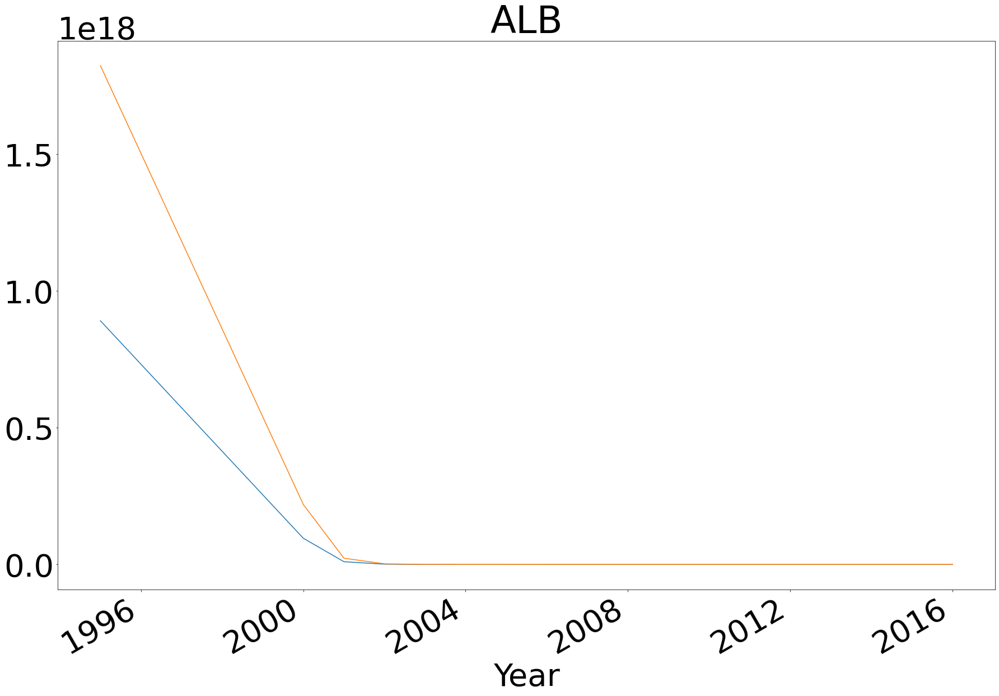

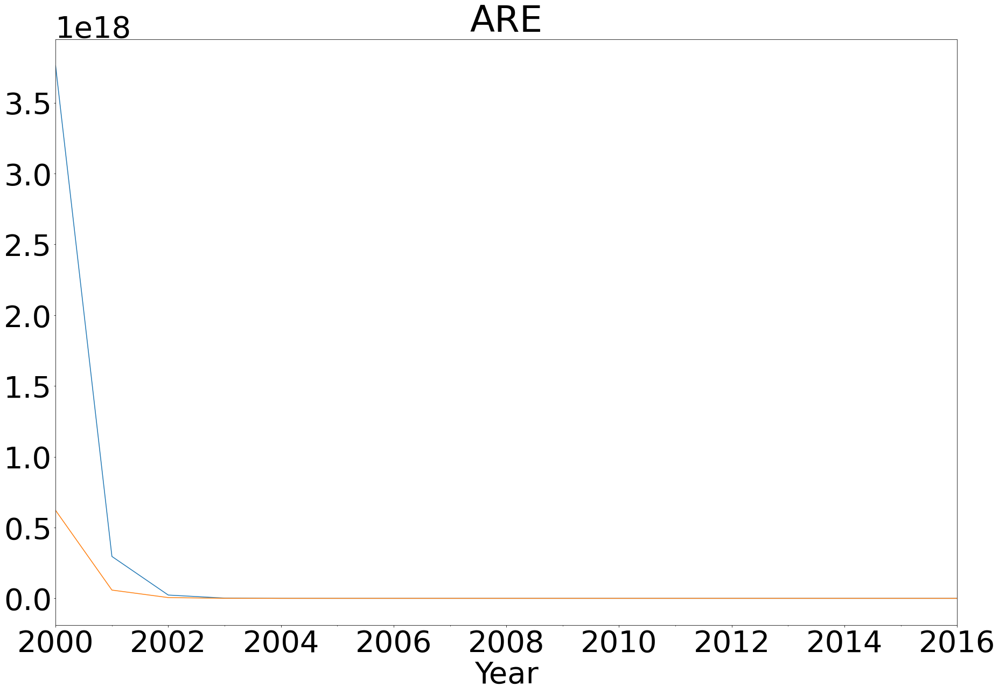

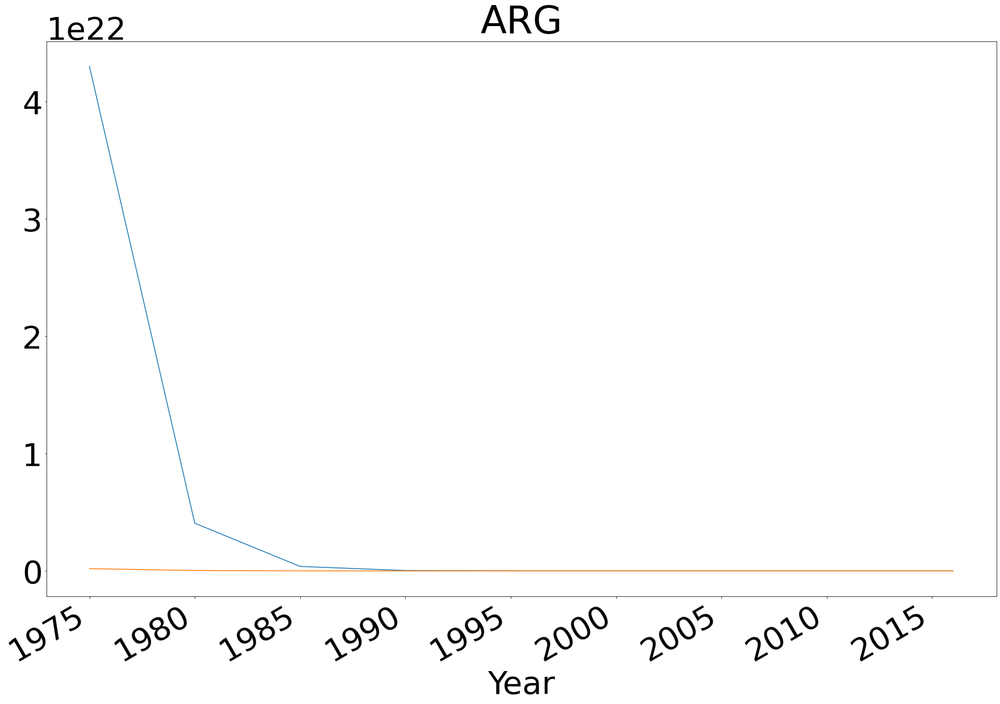

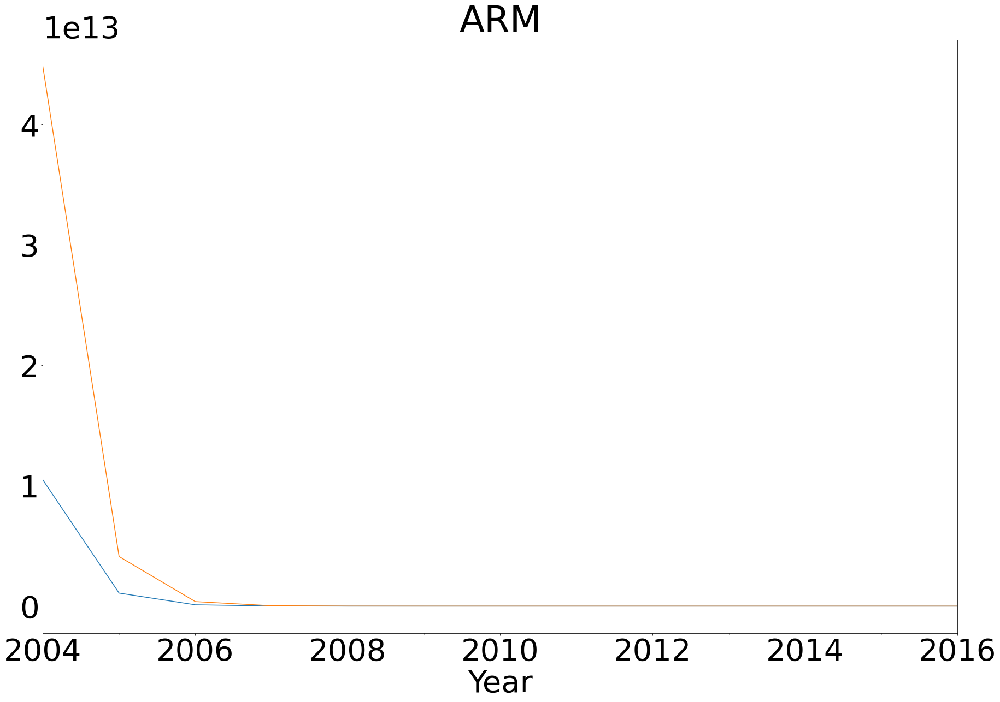

...

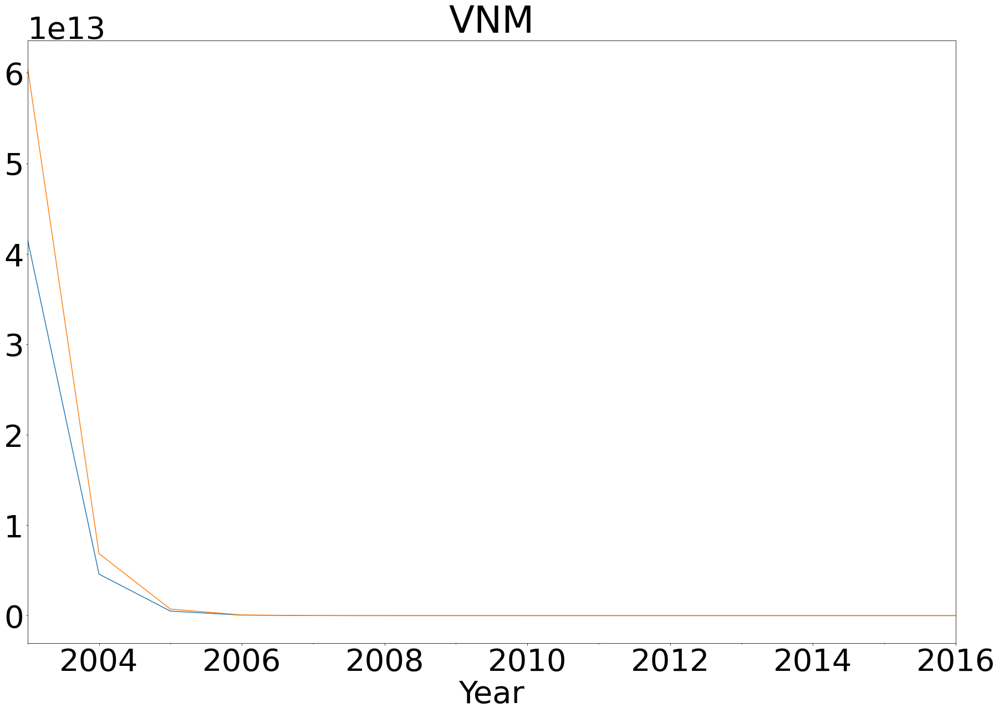

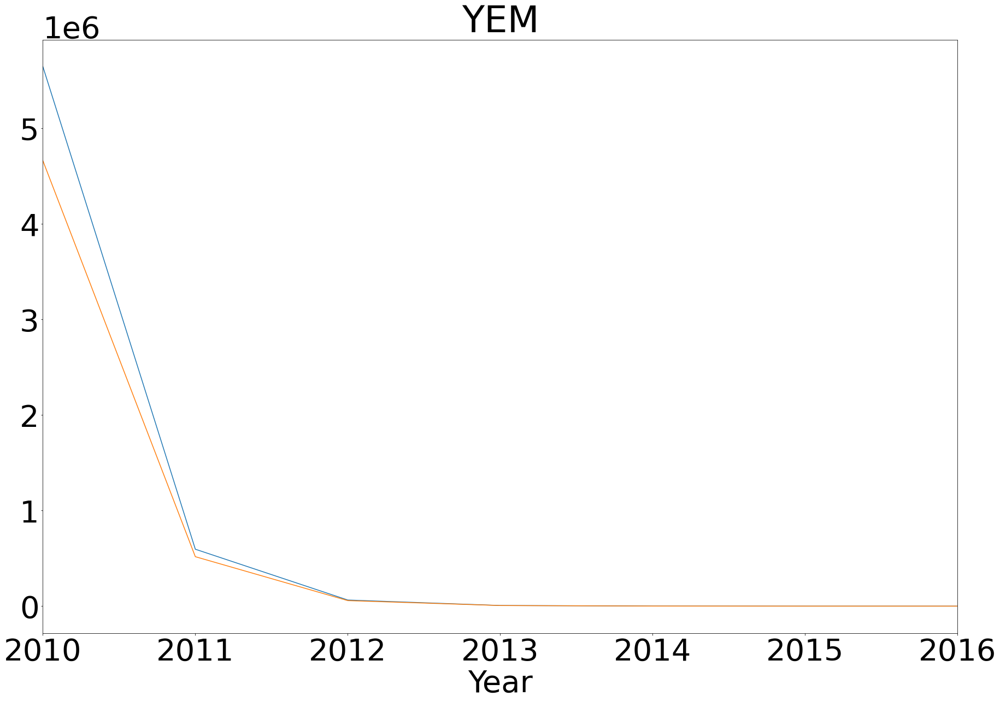

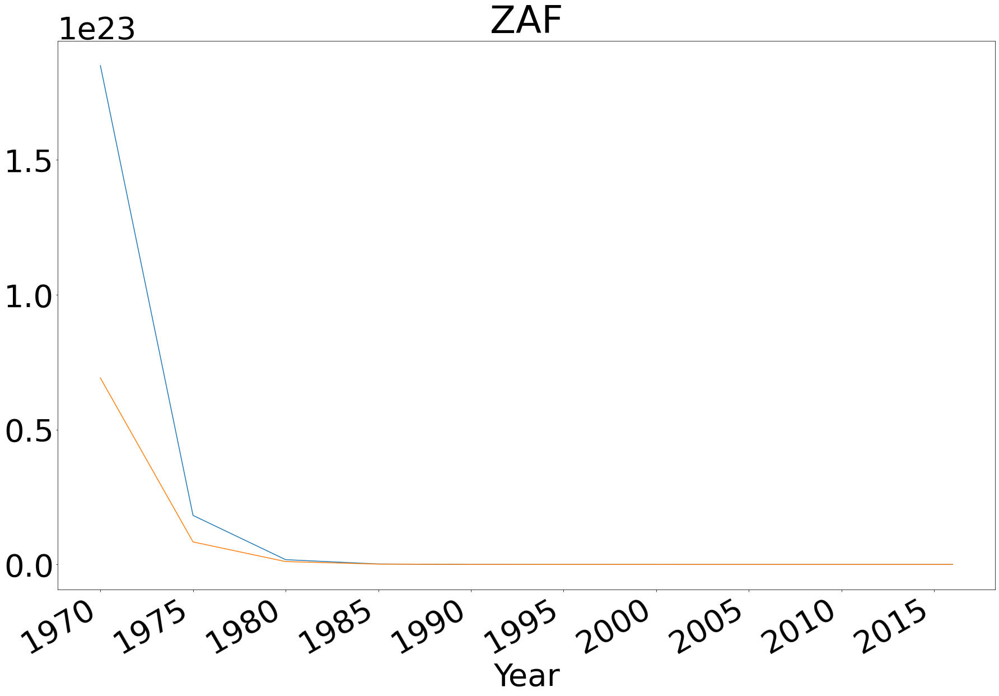

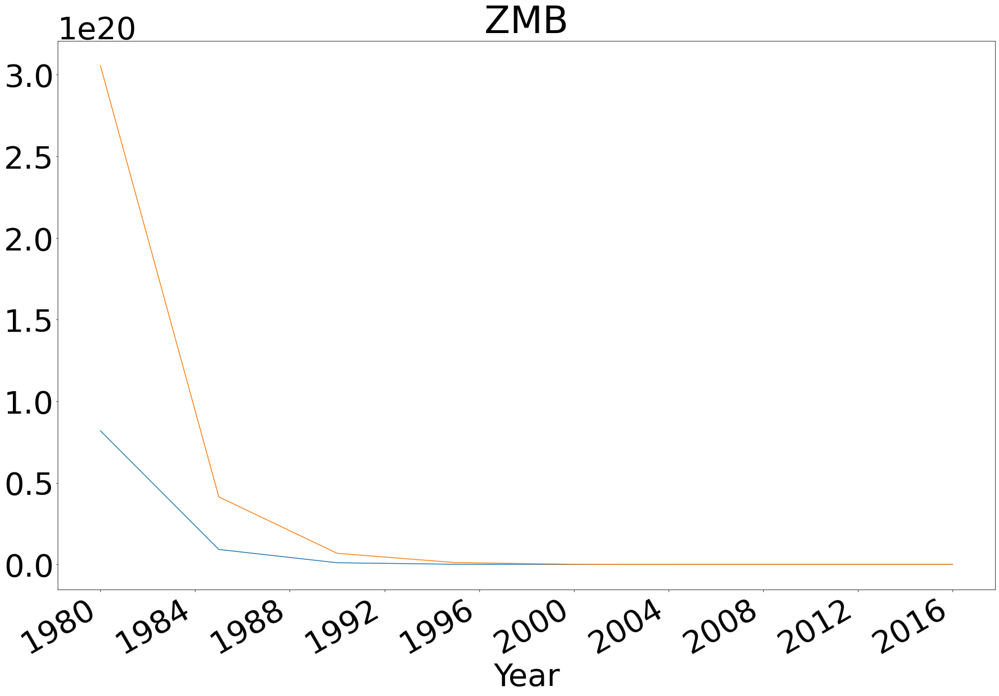

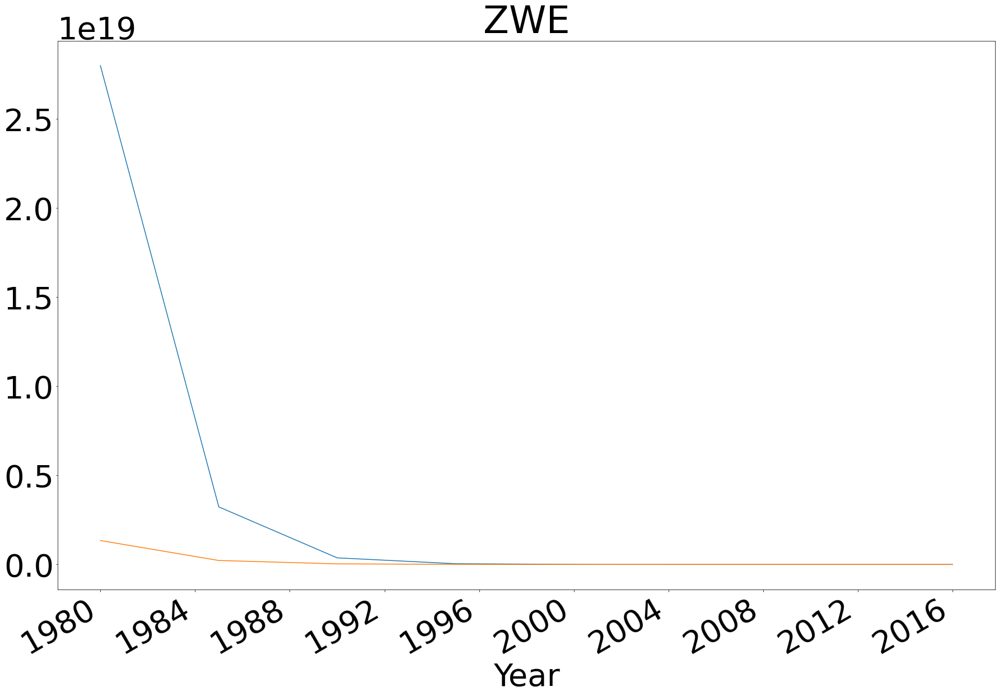

In [9]:
countries = reg_data.groupby("ISO_Code").mean().index
plot_data = reg_data[y_var + ["Log RGDP Per Capita Predictor"]]
for key in plot_data:
    plot_data[key] = plot_data[key] + 1 
for country in countries:
    fig, ax = plt.subplots(figsize = (30,20))

    plot_data[y_var + ["Log RGDP Per Capita Predictor"]].loc[country].cumprod().plot.line(ax = ax, legend = False)
    
    ax.set_title(country)
    
    plt.show()
    plt.close();